<small><i>Based on a notebook put together by Jake Vanderplas.</i></small>

# Topics
## 1. PCA on Handwritten Digits -- continued
## 2. Interpolation in 1D and 2D
## 3. PCA prediction

In [1]:
'''

One school of thought on machine learning:

Pedro Domingo from Washington U.  Listen from 6:20 - 8:30.

'''

import numpy as np
from IPython.lib.display import Audio

Audio('http://podcast.wpr.org/tbk/tbk151129a1.mp3')

In [3]:
%matplotlib inline

''' Initial Imports'''

from __future__ import print_function, division

import numpy as np
import matplotlib.pyplot as plt
from scipy import stats


# ***use seaborn plotting style defaults
import seaborn as sns; sns.set()


#********************* THE MAIN IMPORT OF THIS LECTURE********************************
from sklearn.decomposition import PCA

## Application of PCA to Handwritten Digits Continued...

The projection and dimensionality reduction can be extremely useful when visualizing high-dimensional data.  Let's take a quick look at the application of PCA to the data of handwritten digits.

## sklearn.datasets has a data set of 1797 images of the 10 digits written in different ways.

<type 'numpy.ndarray'> float64 (1797, 64)
<type 'numpy.ndarray'> int64 (1797,)
digits[:14]: [0 1 2 3 4 5 6 7 8 9 0 1 2 3]


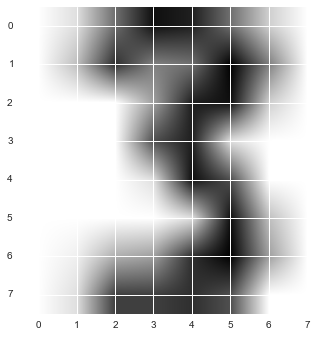

In [5]:
'''Handwritten Digits'''
from sklearn.datasets import load_digits
dig_data = load_digits()
X = dig_data.data
# digits: the values of the digits.
digits = dig_data.target

print(type(X), X.dtype, X.shape)
print(type(digits), digits.dtype, digits.shape)

print('digits[:14]:', digits[:14])

plt.imshow(X[13].reshape((8, 8)), cmap = 'binary')
plt.show()

## Apply PCA

In [6]:
# First, try projecting from 64 to 2 dimensions
pca = PCA(2)  
Xproj = pca.fit_transform(X)
print(X.shape)
print(Xproj.shape)

(1797, 64)
(1797, 2)


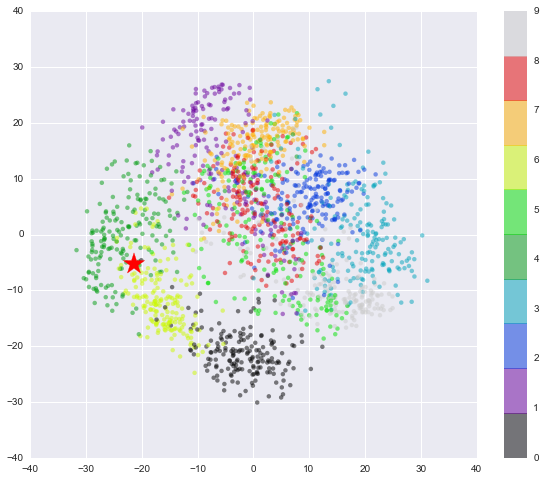

In [7]:
'''

With 2 PCA components, there is "clustering", but not clear enought separate 
all the numbers cleanly.

For example, the star below shows where one of the digital image, 6, is.

'''


plt.figure(figsize = (10, 8))
# c : color or sequence of color -- it's coded as the value of the digits.
# "nipy_spectral" is just a color scheme, you can try others, such as "rainbow"
sp2 = plt.scatter(Xproj[:, 0], Xproj[:, 1], c=digits, edgecolor='none', alpha=0.5,
            cmap=plt.cm.get_cmap('nipy_spectral', 10))

plt.colorbar(sp2)

select_dig = 6
plt.scatter(Xproj[select_dig, 0], Xproj[select_dig, 1], color = 'red', marker = '*', \
           s = 500, alpha=1.)

plt.show()



## Breakout:

## - Do a 3 component PCA
## - Print out the percentage of variance explained by each of the 3 components
## - Do a 3d scatter plot and you can now see unambigouously the same digital image, 6, belong to the "6"-cluster.


original data shape (1797, 64)
pca projection shape (1797, 3)
percentage of variance exlained by the first three components: [ 0.14890594  0.13618771  0.11794594]


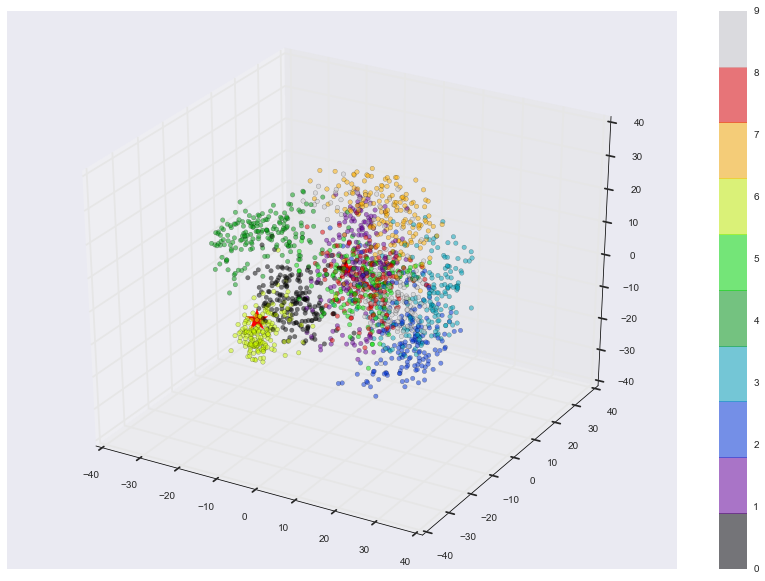

In [9]:
'''
Breakout Solution

If you do this at the terminal, with an interactive GUI, you can see this more clearly:
at a certain angle, the classification of the asterisk data point is unambiguous.

Remember: For Xproj, 0th index refers to which image; 1st index refers to which PCA components.


'''


from mpl_toolkits.mplot3d import Axes3D


# project from 64 to 3 dimensions
pca = PCA(3)  
Xproj = pca.fit_transform(X)
print("original data shape", X.shape)
print("pca projection shape", Xproj.shape)
# percentage of the variance.
print("percentage of variance exlained by the first three components:", \
      pca.explained_variance_ratio_)


fig = plt.figure(figsize = (15, 10))
ax = fig.add_subplot(111, projection='3d')

# Showing where each handwritten digit is the space of the first 3 pca component space. 
sp3 = ax.scatter(Xproj[:, 0], Xproj[:, 1], Xproj[:, 2], c=digits, edgecolor='none', alpha=0.5,
            cmap=plt.cm.get_cmap('nipy_spectral', 10))

# Showing where one of the digit 1's is in that same space. 
select_dig = 6
ax.scatter(Xproj[select_dig, 0], Xproj[select_dig, 1], Xproj[select_dig, 2], color = 'red',\
           marker = '*', s = 500, alpha=1.)

# Showing where one of the digit 2's is in that same space. 
# ...more components are needed!
ax.scatter(Xproj[2, 0], Xproj[2, 1], Xproj[2, 2], color = 'red', \
           marker = '*', s = 500, alpha=1.)

plt.colorbar(sp3)
plt.show()

# Note: the veritcal direction is the 3rd principal axis 
# You can tell by looking at the locations of the black points, the yellow points 
# and the green points

In [122]:
'''How many components do we need to account for 50% and 95% of the variance?'''

pca50 = PCA(0.5) # keep 50% of variance
pca95 = PCA(0.95) # keep 95% of variance

X_trans50 = pca50.fit_transform(X)
X_trans95 = pca95.fit_transform(X)

print(X.shape)
print(X_trans50.shape)
print(X_trans95.shape)

# Thus as you will see, a little more than 5 components are all you need!
# A significant reduction of dimensionality!!

(1797, 64)
(1797, 5)
(1797, 29)


## So what are the PCA components?  
## Answer: Eigenimages.

original data shape: (1797, 64)
pca projection shape: (1797, 5)
percentage of variance exlained by the first 5 components: [ 0.14890594  0.13618771  0.11794594  0.08409979  0.05782415]
Coeff's for the first 5 components:
 [ 15.90610526  -3.33246429  -9.82437176  12.27583834  -6.96516946]
Number of eigenimages: (5, 64)
coeffs.shape (5,)


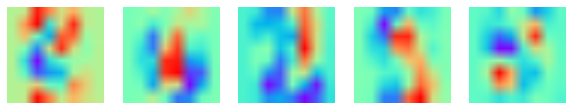

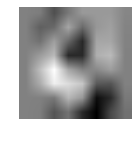

In [17]:
%matplotlib inline


n_comp = 5
dig_idx = 3


# project from 64 to n dimensions
pca = PCA(n_comp)  
Xproj = pca.fit_transform(X)
pca_comps = pca.components_
print("original data shape:", X.shape)
print("pca projection shape:", Xproj.shape)
# percentage of the variance -- NOTICE THE DECREASING ORDER OF SIGNIFICANTCE: 
# This is a feature of PCA; the eigenstates (in this case, eigneimages) are 
# ordered in terms of significance, which is measured by how much of the variance
# is explained by that one component.  
# 
# Do NOT confuse that with the magnitude of the coefficient that goes 
# in front of each component in order to reconstruct an image.
print("percentage of variance exlained by the first {:d} components:".format(n_comp), \
      pca.explained_variance_ratio_)


# These are the coefficients. {0} and {:d} are the same formatting string
print("Coeff's for the first {0} components:\n".format(n_comp), Xproj[dig_idx])


# Number of eigenimages:
print('Number of eigenimages:', pca_comps.shape)

# These are the eigenimages:
f, axes = plt.subplots(1, n_comp, figsize = (10, 2), subplot_kw=dict(xticks=[], yticks=[]))
for i in range(n_comp):
    axes[i].imshow(pca_comps[i].reshape((8, 8)), cmap='rainbow')

dig_im = np.zeros((8, 8))
coeffs = Xproj[dig_idx]

print('coeffs.shape', coeffs.shape)
for i in range(n_comp):
    dig_im += coeffs[i]*pca_comps[i].reshape((8, 8))

fig, ax = plt.subplots(1, 1, figsize = (2, 2))
ax.imshow(dig_im, cmap='binary')
# To turn off grid (under seaborn, the default for grid is on.)
ax.grid(False)
ax.axis('off')
plt.show()

## PCA has two parts:

## 1. Switch basis.  Before PCA, you can think of each 8x8 image as a linear combination of 64 images each with one and only one non-zero pixel in it -- that pixel would be in a different location for each of these 64 images.  You can think of these images as the basis images.  In this sense, all the digit images live in a 64 dimensional space.  

## That is, each digit image is a linear combination of these 64 basis images.  Let's call this space the "single-pixel space".

## PCA switches to a different set of basis images -- the eigenimages.  There will be 64 eigenimages.  Remember you can never change the dimensionality by switching basis. If you start with a 64-dimensional space, you will end with a 64-dimensional space.  Let's call this new space the "PCA space".

## 2. Dimenionality Reduction.  In the single-pixel space, there is no way you can adequately represent an image with just 9 components.  But in the PCA space, you can!  (See cell above.)

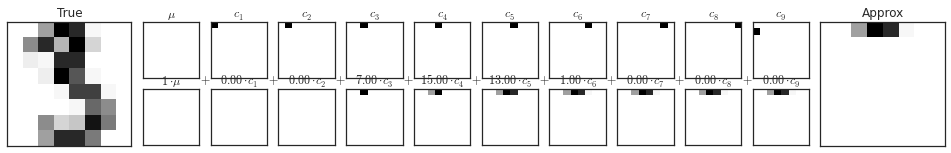

In [124]:
'''
Important to note: As you can see there is no way that you can use just 9 of such basis images 
to adequately represent a digit image (Don't worry about the mean)

But as you saw, in PCA space, 9 components are quite adequate!

'''


from fig_code.figures import plot_image_components

sns.set_style('white')
plot_image_components(dig_data.data[3], n_components=9)

## With Fourier decomposition, all the components (basis vectors) are orthogonal.

## With PCA decomposition, all the components (basis vectors) are _also_ orthogonal.  The components are typically referred to as eigenvectors.  

## Difference between Fouirier decomposition and PCA:

## - Fourier: the basis vectors are always the same for every problem.

## - PCA: For every problem, it figures out an _optimal_ set of basis vectors (components, or eigenvectors).  Therefore a relatively small number of such eigenvectors can be used to construct a partial image that is a good enough approximation (for the purpose of recogntion, e.g.).  
## [Very much like a partial Fourier expansion]

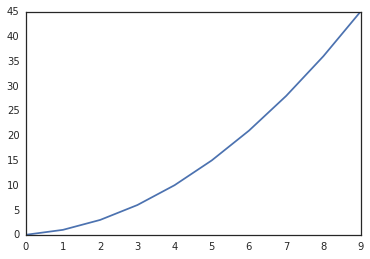

In [136]:
%matplotlib inline
'''
An aside: numpy.cumsum()

np.cumsum(x) will "integrate" an array of values all way to x.

'''
x = np.arange(10)
y = np.cumsum(x)

plt.plot(x, y)
plt.show()


## Breakout: Choosing the Number of Components

## To get a sense of how much information we have thrown away by only keeping a certain number of components, we can plot the _total_ _explained variance_ as a function of the number components.

## Going beyond 20 components the effort will reap only rapidly diminishing returns...

# Why?

## Recognizing a handwritten digit is the prototype of a problem known as classification: digits, English letters, flowers, supernovae, etc.

## The key points to solve this problem with PCA are:

## - Mutilple observation is often needed for any kind of classification.  This creates a problem because of the very high number of dimensions this kind of data usually necessitates.

## - Clearly, there is a level of redundancy present in multiple observations.

## - PCS _extracts_ from these multiple observations the most relevant information for the purpose of classification: a series of eignstates that capture successively lower amount of the variances in the data, so that one often only needs to keep a handful of eigenstates to reconstruct the observed data and accomplish classification.



# An aside: How to Interpolate (Need this for HW08)

## 1. One-dimensional case

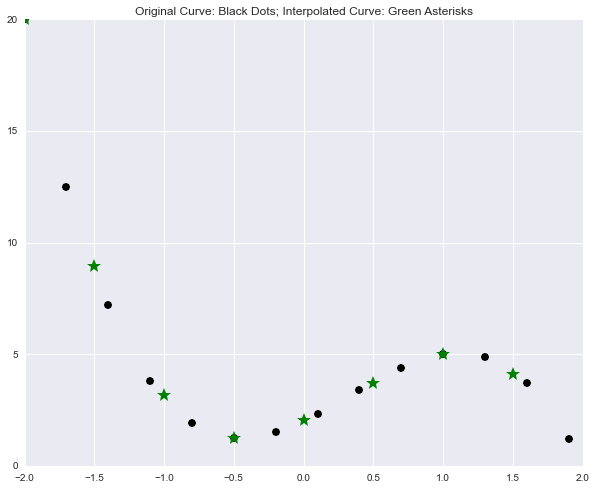

In [18]:
%matplotlib inline
'''

Method 1

numpy.interp(x, xp, yp, left=None, right=None)

The idea: You have data (xp, yp) and you want to interpolate the data onto a new set of x values, x.
This function returns an array (the interpolate y values) that has the same dimension as x.

Documentation: http://docs.scipy.org/doc/numpy-1.8.0/reference/generated/numpy.interp.html


'''

xp = np.arange(-2., 2., 0.3)
yp = 2. + 3.*xp + 2.*xp**2 - 2.*xp**3

x = np.arange(-2., 2., 0.5)
y = np.interp(x, xp, yp)
plt.figure(figsize = (10, 8))
plt.plot(xp, yp, 'k.', ms = 15)
plt.plot(x, y, 'g*', ms = 15)
plt.title('Original Curve: Black Dots; Interpolated Curve: Green Asterisks')
plt.show()


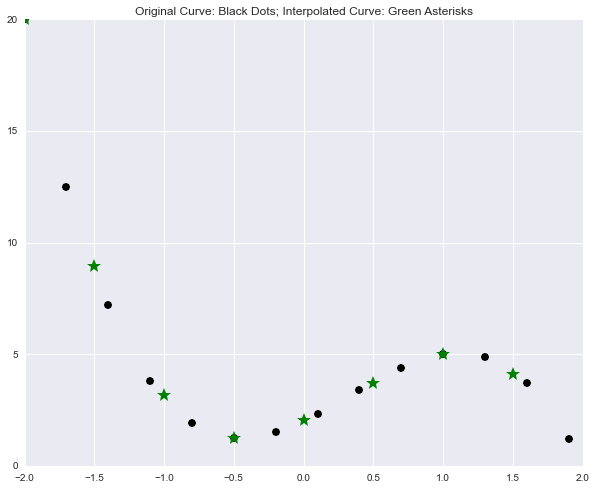

In [19]:
%matplotlib inline
'''

Method 2

scipy.interpolate.interp1d(xp, fp, kind='linear', axis=-1, copy=True, \
bounds_error=True, fill_value=np.nan, assume_sorted=False)

The idea: You have data (xp, fp) and you create a function based on the data, which you now can
apply to *any* value of x or an array of x values.  This function returns a *function*!!

Documentation: http://docs.scipy.org/doc/numpy-1.8.0/reference/generated/numpy.interp.html


'''

from scipy.interpolate import interp1d
xp = np.arange(-2., 2., 0.3)
fp = 2. + 3.*xp + 2.*xp**2 - 2.*xp**3

# create a funcition based on (xp, yp)
f = interp1d(xp, fp)

# A new set of x values
x = np.arange(-2., 2., 0.5)

# Apply f to x
y = f(x)

plt.figure(figsize = (10, 8))
plt.plot(xp, yp, 'k.', ms = 15)
plt.plot(x, y, 'g*', ms = 15)
plt.title('Original Curve: Black Dots; Interpolated Curve: Green Asterisks')
plt.show()


## 2. Two-dimensional case

(512, 512)


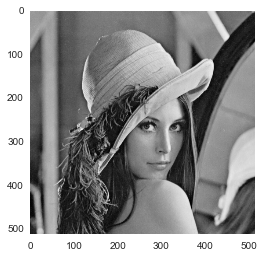

In [26]:
from scipy import signal
from scipy import misc

# the image for lena
lena = misc.lena() 

print(lena.shape)
plt.imshow(lena, cmap = 'gray')
plt.grid('off')
plt.show()


(512, 512)
(64,)
(64, 64)


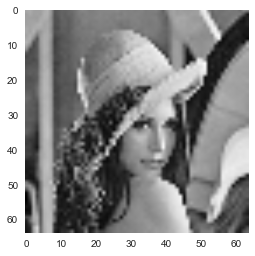

In [30]:
'''

Now do 2d interpolation

scipy.interpolate.interp2d(x, y, z, kind='linear', copy=True, bounds_error=False, fill_value=nan)

Documentation: http://docs.scipy.org/doc/scipy-0.15.1/reference/generated/scipy.interpolate.interp2d.html

'''
from scipy import signal
from scipy import misc

# The key import of this cell:
from scipy.interpolate import interp2d

lena = misc.lena() 
print(lena.shape)

# Note the 0th dimension is y, and 1st dimension is x -- silly convention!
x = np.arange(lena.shape[1])
y = np.arange(lena.shape[0])

f2d = interp2d(x, y, lena)

x_new = np.linspace(0, lena.shape[1], 64)
y_new = np.linspace(0, lena.shape[0], 64)

print(x_new.shape)

lena_new = f2d(x_new, y_new)
print(lena_new.shape)

plt.imshow(lena_new, cmap = 'gray')
plt.grid('off')
plt.show()


(275, 150)


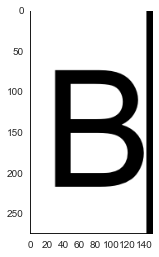

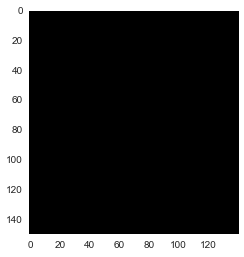

In [52]:
import matplotlib.image as mpimg

letter_b = mpimg.imread('letterB.png') 
letter_B = letter_b[:,:,0]
print(letter_B.shape)

plt.imshow(letter_B, cmap = 'gray')
plt.grid('off')
plt.show()

ylo, yhi, xlo, xhi = 70, 220, 10, 200
cropped_B = letter_B[ylo:yhi,xlo:xhi]
cropped_B[:,20:] = 1
plt.grid('off')
plt.imshow(cropped_B, cmap = 'gray')

    

## Breakout (long -- up to 40 min): 

## 1. Find out, and print, the dimensionality ("shape") of letterB.png (which you can download from HW08 folder).
## 2. Show the image.
## 3. Trim the image -- remove blank space around the letter, so that it's shape is (275, 150).
## 4. Print the dimensionality ("shape") of the trimmed image.
## 5. Remove the dark band at the right edge and show the image again.
## (Reason for doing 3 and 5 separately: So that removing the dark band doesn't change the size of the image.) 
## 6. Interpolate it onto a 16x16 grid.
## 7. Print the shape of the new image.
## 8. Show both the original and the interpolated image.

## To find out which digit an image represents amounts to finding out which n-dimensional cluster does the (partial) PCA representation of that image belong.

## The PCA representation of the image is given by the *n* PCA coefficients.  Therefore, one way to classify is to find the n-dimension _average_ distance between the unknown image and the members of the already classified clusters in PCA space via the Pythagorean Theorem.  

## For example, the distance between the unknown image and the *i*th member of a cluster can be calculated as follows

## _d_i^2_ = (c0 - c0_i)^2 + (c1 - c1_i)^2 + ... + (c_n - c_n_i)^2

## where c0, c1, ..., c_n are the PCA coefficients of the unknown image, and c0_i, c1_i, ..., c_n_i are the PCA cofficients of the *i*th member of a cluster.

## The unknown image belongs to the cluster with which it has the lowest average distance.  

#This accomplishes the classification.

## Now let's try the simplest way of classification

In [ ]:
'''

Note the first 10 images in the data base are simply the ten digits, 0 to 9.

Let's just use them as a trial.  Starting with zero.

For Xproj -- 0th index: which image; 1st index: which PCA component.

'''
select_dig = 0

idx_compare = digits == 0
#idx_compare = digits == 1

Xproj_compare = Xproj[idx_compare, :]
print(Xproj_compare.shape)
metric = 0.
for i in range(Xproj_compare.shape[0]):
    metric += ( (Xproj[select_dig, :] - Xproj_compare[i, :])**2).sum()

# for the "right group"
metric /= (Xproj_compare.shape[0] - 1)

# for the "wrong groups"
metric /= Xproj_compare.shape[0]

print(metric)

## Breakout: 

## Turn the above into a function, so you can compare the PCA coefficients of one image with all possibilities (0 - 9) and determine which has the lowest metric and print out the answer.

## When using this on an actual unknown image that contains a digit, this can be used as a doctest.

# End of Week 15, Lecture 1